In [7]:
#Task 11.1
#import required module
import os
import numpy as np
import pandas as pd
import networkx as nx
from matplotlib import pyplot as plt
%matplotlib inline


In [26]:
#locate the working directory
os.chdir('C:/Users/27737/compsoc/MA_cbg_human_mobility_2020/')
#take a look at the required data
ma_202002_df = pd.read_csv('C:/Users/27737/compsoc/MA_cbg_human_mobility_2020/MA_cbg2cbg_2020_02.csv')
print(ma_202002_df.columns, ma_202002_df.shape)
ma_202002_df.head()


Index(['poi_cbg', 'year_month', 'raw_device_counts', 'visitor_census_tract',
       'visitor_count'],
      dtype='object') (939439, 5)


,poi_cbg,year_month,raw_device_counts,visitor_census_tract,visitor_count
0,250056551003,2020_2,1400,250056551003,95
1,250056551003,2020_2,1400,250056551002,65
2,250056551003,2020_2,1400,250056554001,40
3,250056551003,2020_2,1400,250056516002,38
4,250056551003,2020_2,1400,250056551001,38


In [10]:
ma_202004_df = pd.read_csv('C:/Users/27737/compsoc/MA_cbg_human_mobility_2020/MA_cbg2cbg_2020_04.csv')
print(ma_202004_df.columns, ma_202004_df.shape)
ma_202004_df.head()

Index(['poi_cbg', 'year_month', 'raw_device_counts', 'visitor_census_tract',
       'visitor_count'],
      dtype='object') (384826, 5)


,poi_cbg,year_month,raw_device_counts,visitor_census_tract,visitor_count
0,250010135001,2020_4,417,250010135001,120
1,250010135001,2020_4,417,250010136001,31
2,250010135001,2020_4,417,250010134003,16
3,250010135001,2020_4,417,250010135004,13
4,250010135001,2020_4,417,250010135002,10


In [38]:
#check the number of visitors by different neighborhood in Feb 2020.
describeby_neighbor_02 = ma_202002_df.groupby(['poi_cbg']).agg({'visitor_count':'sum'}).reset_index()
describeby_neighbor_02 = describeby_neighbor_02['visitor_count'].describe()

describeby_neighbor_02

count     4984.000000
mean      1306.498997
std       1931.189159
min          4.000000
25%        443.000000
50%        796.000000
75%       1474.250000
max      69792.000000
Name: visitor_count, dtype: float64

In [40]:

describeby_neighbor_04 = ma_202004_df.groupby(['poi_cbg']).agg({'visitor_count':'sum'}).reset_index()
describeby_neighbor_04 = describeby_neighbor_04['visitor_count'].describe()

describeby_neighbor_04

count     4984.000000
mean       560.564005
std        648.439325
min          8.000000
25%        230.000000
50%        380.000000
75%        642.000000
max      16745.000000
Name: visitor_count, dtype: float64

1)The mean of visitors numbers in Feb. 2020 is around 1306, and this number decrease to 561 in April. This dramatic decline implies that the pandemic, travel ban and people's fear have great negative impacts on people's mobility patterns.

In [39]:
#Check if there are changes in the number of percentage of visitors
ma_202002_df['percent_visitor'] = ma_202002_df.visitor_count/ma_202002_df.raw_device_counts
percent_02 = ma_202002_df['percent_visitor'].describe()
percent_02

count    939439.000000
mean          0.004406
std           0.011523
min           0.000049
25%           0.000986
50%           0.002240
75%           0.004648
max           0.666667
Name: percent_visitor, dtype: float64

In [41]:
ma_202004_df['percent_visitor'] = ma_202004_df.visitor_count/ma_202004_df.raw_device_counts
percent_04 = ma_202004_df['percent_visitor'].describe()
percent_04

count    384826.000000
mean          0.010980
std           0.027343
min           0.000167
25%           0.003046
50%           0.005995
75%           0.010730
max           0.551037
Name: percent_visitor, dtype: float64

There is a counter-intuitive result that the percentage of visitor in April, MA is higher than February. However, since the data of devices' raw number is not the concrete number of residents in the origin neighborhoods, if the raw number of device and the number of visitors decrease at the same time, the percentage of visitor can increase under these circumstances.

In [50]:
# Check the change of number of devices
describe_by_neighbor_04 = ma_202004_df.groupby(['poi_cbg']).agg({'raw_device_counts':'sum'}).reset_index()
describe_by_neighbor_04.rename(columns={'raw_device_counts':'device_counts_after'}, inplace=True)
describe_by_neighbor_04


,poi_cbg,device_counts_after
0,250010101001,27900
1,250010101002,4134
2,250010101003,2592
3,250010101004,11408
4,250010101005,6188
...,...,...
4979,250277614002,11020
4980,250277614003,11501
4981,250277614004,10413
4982,250277614005,37665


In [49]:
describe_by_neighbor_02 = ma_202002_df.groupby(['poi_cbg']).agg({'raw_device_counts':'sum'}).reset_index()
describe_by_neighbor_02

,poi_cbg,raw_device_counts
0,250010101001,68364
1,250010101002,10249
2,250010101003,10920
3,250010101004,191477
4,250010101005,77395
...,...,...
4979,250277614002,16896
4980,250277614003,134620
4981,250277614004,25854
4982,250277614005,131040


In [51]:
df_merged = pd.merge(describe_by_neighbor_02, describe_by_neighbor_04)

df_merged

,poi_cbg,raw_device_counts,device_counts_after
0,250010101001,68364,27900
1,250010101002,10249,4134
2,250010101003,10920,2592
3,250010101004,191477,11408
4,250010101005,77395,6188
...,...,...,...
4979,250277614002,16896,11020
4980,250277614003,134620,11501
4981,250277614004,25854,10413
4982,250277614005,131040,37665


Just like the way we assumed before, the numbers of raw device counts also declined dramatically in the neighborhoods. According to the decline of mobility inside and outside neighborhood, the raw number of devices collected in single neighborhoods can decline even more significant than the number of visitors, which is also relevant to the increase of visitor percentage.

In [ ]:
#Task 11.2
# Create the network graph for each dataframe
G = nx.Graph()
for i in range(len(ma_202002_df)):
    origin_cbg = ma_202002_df.loc[i, 'poi_cbg']
    destination_cbg = ma_202002_df.loc[i, 'visitor_census_tract']
    if str(origin_cbg)[:2] == '25' and str(destination_cbg)[:2] == '25':
        total_residents_in_origin = ma_202002_df.loc[i, 'raw_device_counts']
        num_visitor = ma_202002_df.loc[i, 'visitor_count']
        percent_visitor = num_visitor / total_residents_in_origin
        print(total_residents_in_origin, num_visitor, percent_visitor)
        G.add_edge(origin_cbg, destination_cbg, weight=percent_visitor)

In [25]:
print(nx.info(G))
G.nodes()

Graph with 4984 nodes and 635681 edges


C:\Users\27737\AppData\Local\Temp\ipykernel_7056\3385744006.py:1: DeprecationWarning: info is deprecated and will be removed in version 3.0.

  print(nx.info(G))


NodeView((250056551003, 250056551002, 250056554001, 250056516002, 250056551001, 250056554003, 250056553001, 250056554004, 250235601005, 250056552002, 250056554002, 250056553003, 250235601003, 250235601006, 250056541004, 250056541003, 250235411002, 250056552005, 250056552003, 250056552001, 250056542002, 250056553002, 250056552004, 250235411001, 250235601002, 250235601001, 250056541002, 250235611004, 250056531021, 250056542003, 250059855001, 250235411003, 250056533042, 250056531022, 250056501022, 250056509002, 250056523001, 250235611003, 250056503004, 250235451001, 250056513002, 250235452002, 250235061011, 250235309013, 250235451003, 250235601004, 250056514002, 250056141011, 250235611002, 250056507001, 250056502011, 250056506001, 250056524001, 250010135001, 250056515004, 250056501012, 250235611001, 250056507002, 250235211013, 250056501013, 250056441012, 250056503003, 250056527003, 250235452003, 250056511001, 250056511003, 250056508003, 250056171021, 250056514001, 250056506002, 2500565010

In [24]:
G_2 = nx.Graph()
for i in range(len(ma_202004_df)):
    origin_cbg = ma_202004_df.loc[i, 'poi_cbg']
    destination_cbg = ma_202004_df.loc[i, 'visitor_census_tract']
    if str(origin_cbg)[:2] == '25' and str(destination_cbg)[:2] == '25':
        total_residents_in_origin = ma_202004_df.loc[i, 'raw_device_counts']
        num_visitor = ma_202004_df.loc[i, 'visitor_count']
        percent_visitor = num_visitor / total_residents_in_origin
        G_2.add_edge(origin_cbg, destination_cbg, weight=percent_visitor)
        print(total_residents_in_origin, num_visitor, percent_visitor)
print(nx.info(G_2))


417 120 0.28776978417266186
417 31 0.07434052757793765
417 16 0.03836930455635491
417 13 0.03117505995203837
417 10 0.023980815347721823
417 9 0.02158273381294964
417 8 0.019184652278177457
417 8 0.019184652278177457
417 6 0.014388489208633094
417 6 0.014388489208633094
417 6 0.014388489208633094
417 5 0.011990407673860911
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728
417 4 0.009592326139088728


C:\Users\27737\AppData\Local\Temp\ipykernel_7056\2354307276.py:11: DeprecationWarning: info is deprecated and will be removed in version 3.0.

  print(nx.info(G_2))


In [56]:
G_2.nodes()

NodeView((250010135001, 250010136001, 250010134003, 250010135004, 250010135002, 250010135003, 250010136002, 250010136003, 250010131004, 250010134004, 250173567023, 250010122003, 250214042013, 250010133003, 250250601014, 250010125023, 250173703004, 250173839013, 250010117003, 250235454004, 250010144022, 250010151001, 250010139002, 250251604001, 250010134001, 250010126024, 250010120014, 250010122001, 250010129003, 250010137003, 250010131001, 250010132001, 250235452004, 250235306005, 250235452003, 250010103062, 250235309013, 250010115005, 250010145001, 250010115002, 250010115003, 250010128003, 250010132002, 250173398014, 250173425001, 250173398022, 250173400002, 250173398013, 250173414004, 250173422021, 250173507004, 250173412005, 250173399001, 250173398021, 250173401003, 250173412003, 250173422011, 250173400001, 250250402001, 250173423002, 250173414003, 250173422012, 250173423003, 250173413001, 250173417003, 250173401002, 250173418005, 250173401004, 250251703001, 250173425002, 2501734110

In [57]:
#check the node degree and compare the numbers
Gn_weighted = []
Gn_unweighted = []
for node in G.nodes():
    Gn_weighted.append(G.degree(node, weight='weight'))
    Gn_unweighted.append(G.degree(node))

df_02 = pd.DataFrame(columns = ['cbg_id','weighted','unweighted'])
df_02['cbg_id'] = G.nodes()
df_02['weighted'] = Gn_weighted
df_02['unweighted'] = Gn_unweighted

df_02

,cbg_id,weighted,unweighted
250056551003,{},0.851345,167
250056551002,{},1.784491,362
250056554001,{},1.344236,161
250056516002,{},2.359225,400
250056551001,{},1.335834,148
...,...,...,...
250179800001,{},0.666667,1
250239900030,{},0.666667,2
250056171015,{},0.363636,1
250059900000,{},0.400000,5


<AxesSubplot: >

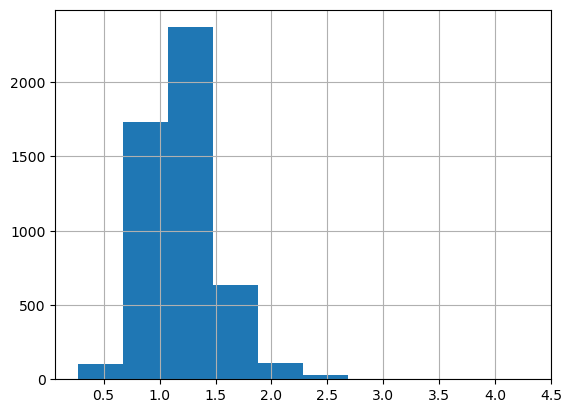

In [60]:
df_02['weighted'].hist()

In [59]:
Gn2_weighted = []
Gn2_unweighted = []
for node in G_2.nodes():
    Gn2_weighted.append(G_2.degree(node, weight='weight'))
    Gn2_unweighted.append(G_2.degree(node))

df_04 = pd.DataFrame(columns = ['cbg_id','weighted','unweighted'])
df_04['cbg_id'] = G_2.nodes()
df_04['weighted'] = Gn2_weighted
df_04['unweighted'] = Gn2_unweighted

df_04

,cbg_id,weighted,unweighted
250010135001,{},1.526527,102
250010136001,{},1.607892,222
250010134003,{},1.373455,103
250010135004,{},1.538106,69
250010135002,{},1.321292,63
...,...,...,...
250079900000,{},0.714286,5
250199900000,{},1.000000,2
250056171015,{},1.052632,5
250259813001,{},0.500000,5


<AxesSubplot: >

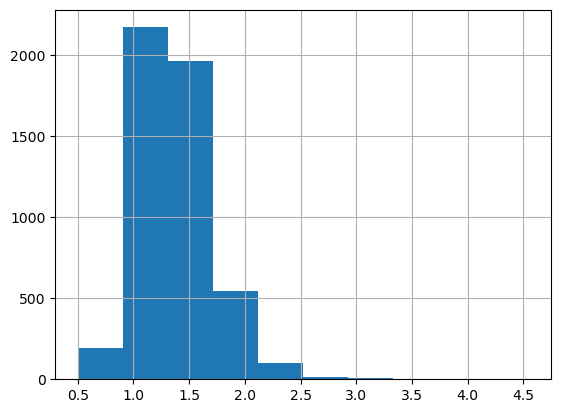

In [61]:
df_04['weighted'].hist()

The level of node degree indicates the number of connections a node has to other nodes in the network. According to this two histogram, we can see that the median of nodes degree decrease in April, which implies that more nodes have less connection with others. Therefore, compared with number in February, the number of connection between MA people in April decreased.

In [64]:
#Check the clustering coefficient
print(nx.clustering(G))

{250056551003: 0.45912786400591277, 250056551002: 0.2943980191891055, 250056554001: 0.4539447496218454, 250056516002: 0.23543409743933774, 250056551001: 0.47510628247520076, 250056554003: 0.41342832469775476, 250056553001: 0.2590638528138528, 250056554004: 0.45046027131782945, 250235601005: 0.3792039800995025, 250056552002: 0.43232880914040334, 250056554002: 0.541980198019802, 250056553003: 0.4619805481874447, 250235601003: 0.41586165772212286, 250235601006: 0.27944188428059397, 250056541004: 0.381882721225334, 250056541003: 0.36199095022624433, 250235411002: 0.2832656913638509, 250056552005: 0.5049377415199656, 250056552003: 0.4502894954507858, 250056552001: 0.4131276582238304, 250056542002: 0.3921622237411711, 250056553002: 0.4279030910609858, 250056552004: 0.5097832947612034, 250235411001: 0.2717655642023346, 250235601002: 0.4068283917340521, 250235601001: 0.4013557737260402, 250056541002: 0.5140929535232384, 250235611004: 0.3239403267819086, 250056531021: 0.32477893118031526, 25005

In [65]:
nx. average_clustering(G)

0.3358877036019045

In [66]:
print(nx.clustering(G_2))

{250010135001: 0.3393939393939394, 250010136001: 0.20116230801162308, 250010134003: 0.34435643564356433, 250010135004: 0.48530076888285845, 250010135002: 0.4972677595628415, 250010135003: 0.33072211935621704, 250010136002: 0.3456582633053221, 250010136003: 0.4287865100873231, 250010131004: 0.342911877394636, 250010134004: 0.34034833091436867, 250173567023: 0.11157340985174558, 250010122003: 0.23521716378859236, 250214042013: 0.1780885780885781, 250010133003: 0.21218015861140208, 250250601014: 0.08405797101449275, 250010125023: 0.3970231914157148, 250173703004: 0.1431440045897877, 250173839013: 0.24061096136567833, 250010117003: 0.28484848484848485, 250235454004: 0.2242587601078167, 250010144022: 0.31373415856174475, 250010151001: 0.343231961836613, 250010139002: 0.2844519250999369, 250251604001: 0.08408289677440611, 250010134001: 0.36, 250010126024: 0.4803370786516854, 250010120014: 0.2562453806356245, 250010122001: 0.4885912698412698, 250010129003: 0.3851512062521237, 250010137003: 0.

In [67]:
nx. average_clustering(G_2)

0.2799481682222787

The average value of clustering coefficient

The average value of clustering coefficient in February is 0.34, and in April it's 0.28, which indicates a decline of nodes' tendency that cluster together. In other words, MA neighborhoods in April have less possibility to cluster together, so there is less mobility among them.

In [68]:
# the closeness centrality
d = nx.closeness_centrality(G, u = None, distance=None, wf_improved=True)
print(d)

{250056551003: 0.4611327040533037, 250056551002: 0.5150919991730412, 250056554001: 0.49356180665610144, 250056516002: 0.518522372528616, 250056551001: 0.48633613117314073, 250056554003: 0.5039441747572816, 250056553001: 0.5152517836831765, 250056554004: 0.4848691252310986, 250235601005: 0.49616648411829134, 250056552002: 0.47371423139081664, 250056554002: 0.44085640980270724, 250056553003: 0.46439888164026094, 250235601003: 0.4772074315265275, 250235601006: 0.5085212776813961, 250056541004: 0.5086250893130551, 250056541003: 0.4996490524415923, 250235411002: 0.5127598271249229, 250056552005: 0.48633613117314073, 250056552003: 0.46470204233889767, 250056552001: 0.4947870122132857, 250056542002: 0.5027239709443099, 250056553002: 0.47881233784952437, 250056552004: 0.47169632714880727, 250235411001: 0.5099263200982399, 250235601002: 0.4932198356923686, 250235601001: 0.4629319955406912, 250056541002: 0.48624121779859486, 250235611004: 0.5000501756146513, 250056531021: 0.5120748124550406, 250

In [69]:
max_value_02 = max(d, key=d.get)
print(max_value_02) #250249813002 has the largest number of mean closeness_centrality

250259813002


In [72]:
print(min(d,key=d.get))
print(d[250259813002])

250056171015
0.8085348044783385


In [76]:
print(d[250056171015])

0.3381514657980456


In [73]:
d_2 = nx.closeness_centrality(G_2, u = None, distance=None, wf_improved=True)
print(d_2)

{250010135001: 0.41048036587641545, 250010136001: 0.4777064148664354, 250010134003: 0.429667977631915, 250010135004: 0.3829362183429712, 250010135002: 0.3943015592118761, 250010135003: 0.4066938939299637, 250010136002: 0.4069264233147149, 250010136003: 0.38867219540037873, 250010131004: 0.41693867274600843, 250010134004: 0.38852064264540703, 250173567023: 0.4905957853906504, 250010122003: 0.44641578858799774, 250214042013: 0.4244334810565731, 250010133003: 0.4502078619774132, 250250601014: 0.41051418924209415, 250010125023: 0.3944888906993471, 250173703004: 0.4423725981745742, 250173839013: 0.4445039436689914, 250010117003: 0.4445039436689914, 250235454004: 0.43096887548806706, 250010144022: 0.43317974094792233, 250010151001: 0.4128273285251951, 250010139002: 0.4049089889988666, 250251604001: 0.5212387738692252, 250010134001: 0.37816913622605547, 250010126024: 0.384799582964552, 250010120014: 0.4727203909898524, 250010122001: 0.3761987616583897, 250010129003: 0.4075255787846262, 250010

In [74]:
max_value_04 = max(d_2, key=d_2.get)
print(max_value_04) #250138011011 has the largest number of mean closeness_centrality

250138011011


In [83]:
print(min(d_2,key=d_2.get))
print(d_2[250138011011])

250199900000
0.55534502292298


In [81]:
min_value_04 = min(d_2, key=d_2.get)
print(min_value_04)

250199900000


In [84]:
print(d_2[250199900000])

0.0


In this part, I wanted to test the change of largest and shortest average distances from February to April. However, the neighborhood has the largest average distance to other's closeness centrality value is 0.81, and the one in April is 0.55. The number of the shortest average distance also decline. These numbers decrease might because the decline of mobility also make people less likely to visit communities that are far away from them.

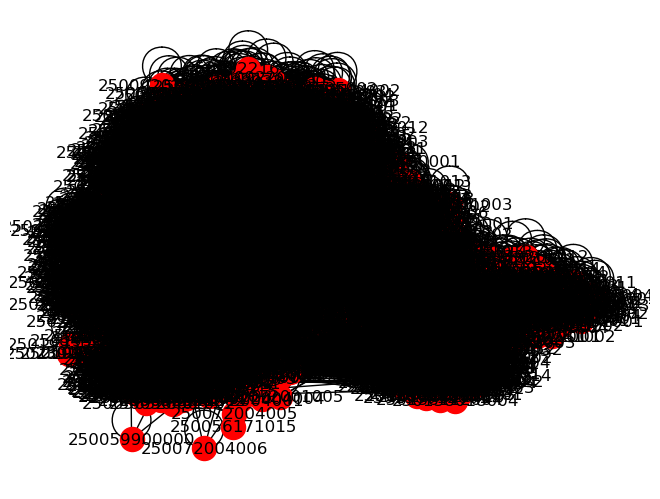

In [53]:
my_pos = nx.spring_layout(G, seed = 100)
nx.draw(G, with_labels=True, pos=my_pos, node_color='red')